# Data Visualisation

In [1]:
import os
import sys
sys.path.append('..') # Add parent directory to path to always find flood_tool
                      # This is not best practice, but it works for this example

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import flood_tool as ft
from flood_tool.geo import get_gps_lat_long_from_easting_northing


# The unlabelled postcode data
df1 = pd.read_csv(os.path.join(ft._example_dir,
                               'postcodes_unlabelled.csv'))
df1.tail()

,postcode,easting,northing,soilType,elevation,nearestWatercourse,distanceToWatercourse,localAuthority
9995,TN22 5HX,551700,120200,Luvisols,70,NaN,560.0,Wealden
9996,RH2 0HH,526182,151672,Unsurveyed/Urban,120,Redhill Brook,3390.0,Reigate and Banstead
9997,OX9 8BE,459900,196300,Luvisols,50,River Thame,610.0,South Oxfordshire
9998,EX14 9YT,321461,104539,Cambisols,210,Umborne Brook,290.0,East Devon
9999,BA1 1WH,375350,164483,Unsurveyed/Urban,20,River Avon,1780.0,Bath and North East Somerset


In [2]:
# The labelled postcode data
df2 = pd.read_csv(os.path.join(ft._data_dir, 'postcodes_labelled.csv'))
df2.head()

,postcode,easting,northing,soilType,elevation,nearestWatercourse,distanceToWatercourse,localAuthority,riskLabel,medianPrice,historicallyFlooded
0,BA1 1AL,374813,164571,Unsurveyed/Urban,20,River Avon,1240.0,Bath and North East Somerset,5,621800.0,1
1,BA1 1AN,375116,164500,Unsurveyed/Urban,20,River Avon,1550.0,Bath and North East Somerset,3,577900.0,0
2,BA1 1AR,375091,164454,Unsurveyed/Urban,20,River Avon,1540.0,Bath and North East Somerset,5,533300.0,1
3,BA1 1BG,375060,164969,Unsurveyed/Urban,30,River Avon,1450.0,Bath and North East Somerset,1,563600.0,0
4,BA1 1BH,375021,164930,Unsurveyed/Urban,30,River Avon,1410.0,Bath and North East Somerset,1,570800.0,0


## EDA Analysis

Showing you the first 5 rows of the data
Focusing now on any missing values in the data
postcode                  0.00000
easting                   0.00000
northing                  0.00000
soilType                  0.00000
elevation                 0.00000
nearestWatercourse       37.61375
distanceToWatercourse     0.00000
localAuthority            0.00000
riskLabel                 0.00000
medianPrice               7.75250
historicallyFlooded       0.00000
dtype: float64
Checking for the correlation between different features in the data
                        easting  northing  elevation  distanceToWatercourse  \
easting                1.000000  0.579649  -0.188363               0.218699   
northing               0.579649  1.000000  -0.005679               0.093232   
elevation             -0.188363 -0.005679   1.000000               0.119183   
distanceToWatercourse  0.218699  0.093232   0.119183               1.000000   
riskLabel             -0.020270  0.029430  -0.228331        

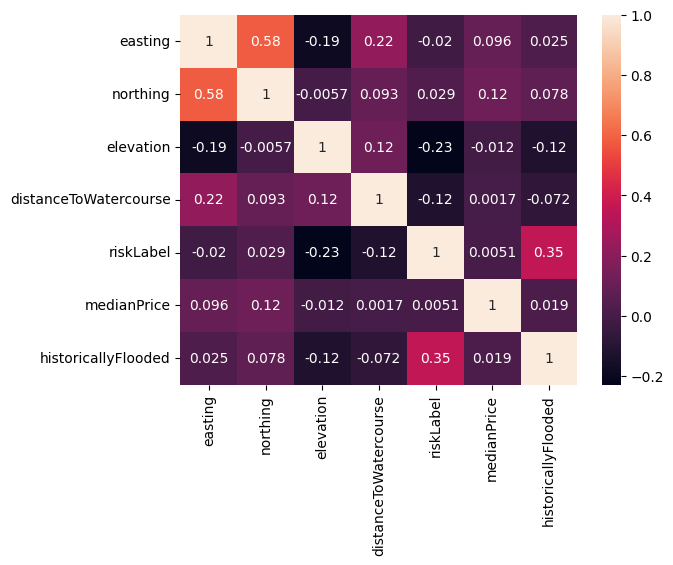


 ---Pairplot for numerical features---


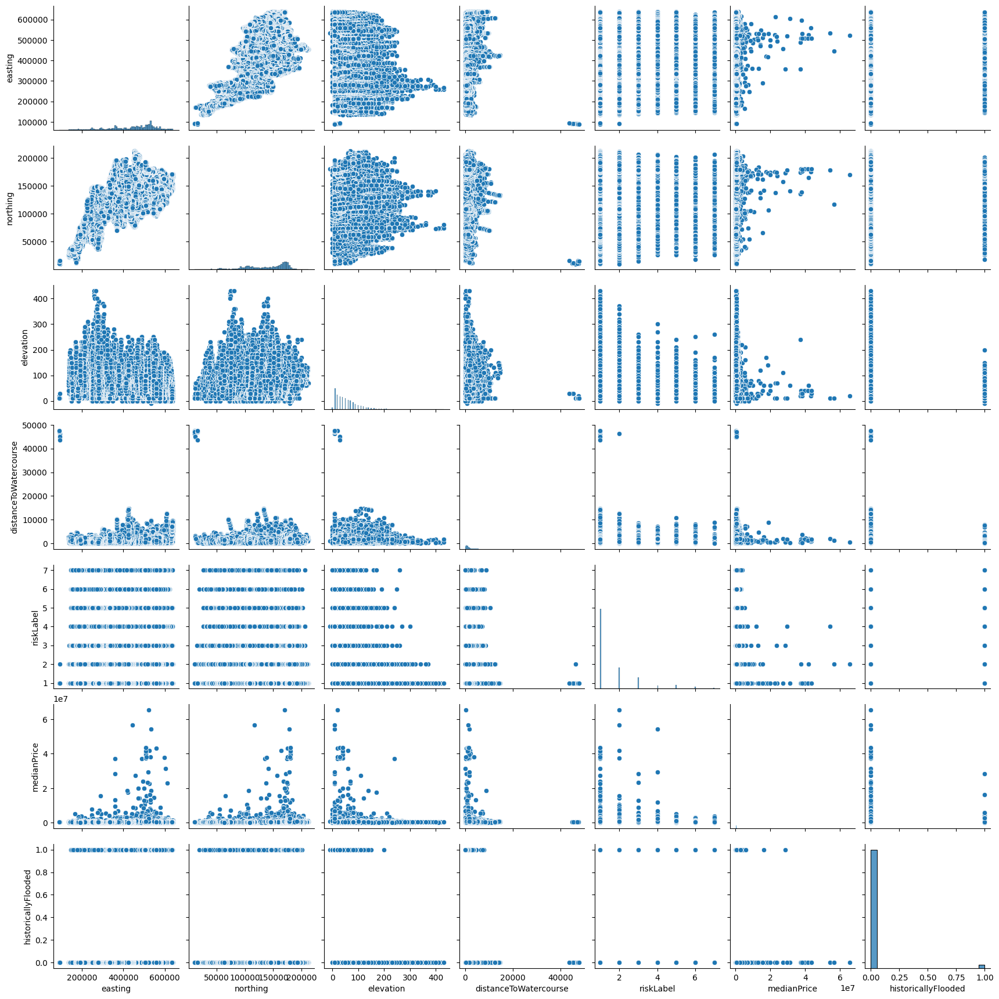


 ---Checking numerical data distribution---


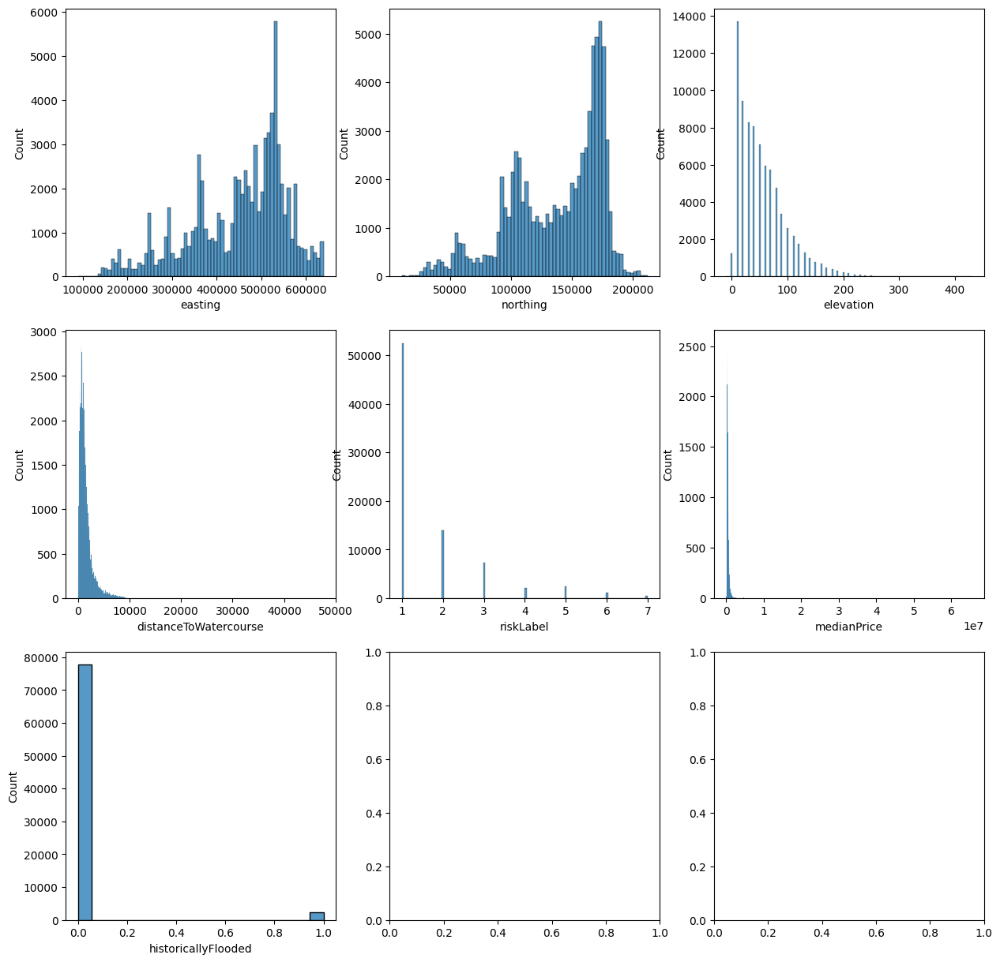


 ---Checking the distribution of MedianPrice and impacts of outliers---


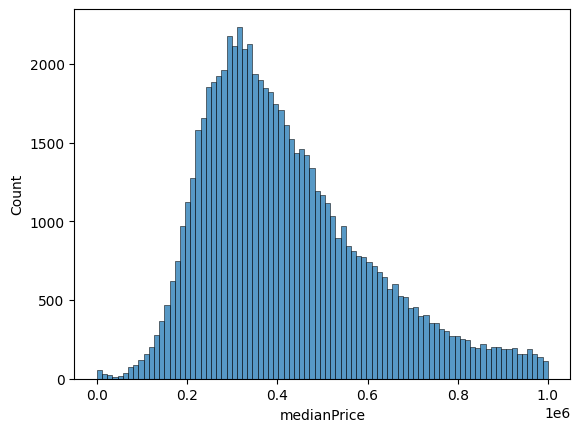


 ---Checking the description of the dataset---

 ---No outliers in the location data---

 ---Distribution of data with BoxPlot---


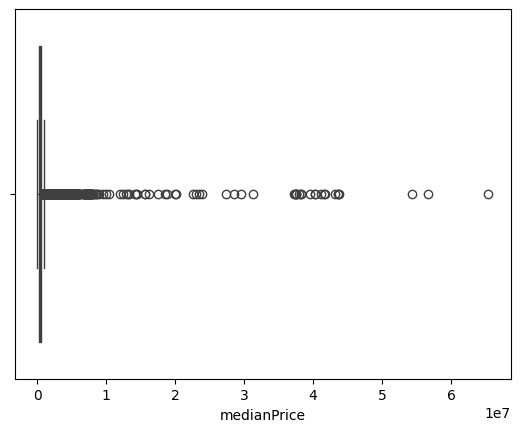

In [3]:
from flood_tool.visualization.analysis import eda_function
eda_function("../flood_tool/resources/postcodes_labelled.csv")

# Understanding where more areas are at risk from flooding from rainfall levels

In [4]:
wet_day = pd.read_csv('../flood_tool/example_data/wet_day.csv')
stations = pd.read_csv('../flood_tool/resources/stations.csv')
merged_data = pd.merge(wet_day, stations, on='stationReference', how='left')
merged_data['value'] = pd.to_numeric(merged_data['value'], errors='coerce')
non_numeric_values = merged_data[merged_data['value'].isna()]
merged_data = merged_data.dropna(subset=['value']) 

rainfall_threshold = 10
river_level_threshold = 2.0

high_risk = merged_data[
    (merged_data['parameter'] == 'rainfall') & (merged_data['value'] > rainfall_threshold) |
    (merged_data['parameter'] == 'level') & (merged_data['value'] > river_level_threshold)
]

import folium
from folium.plugins import HeatMap


risk_map = folium.Map(location=[51.5, -0.1], zoom_start=6)

heat_data = high_risk[['latitude', 'longitude', 'value']].dropna().values.tolist()
HeatMap(heat_data).add_to(risk_map)


risk_map.save('risk_map.html')
risk_map

In [5]:
#divided the data into 3 dataframes for plotting
lat, long = get_gps_lat_long_from_easting_northing(df2['easting'], df2['northing'])
risk_label = df2['riskLabel']
postcode = df2['postcode']
combined = np.column_stack((lat, long, risk_label, postcode))
full_data = pd.DataFrame(combined, columns=['Latitude', 'Longitude', 'Risk Label', 'Postcode'])

lat, long = get_gps_lat_long_from_easting_northing(df2['easting'], df2['northing'])
risk_label = df2['historicallyFlooded']
postcode = df2['postcode']
combined = np.column_stack((lat, long, risk_label, postcode))
full_data_historic = pd.DataFrame(combined, columns=['Latitude', 'Longitude', 'historicallyFlooded', 'Postcode'])

lat, long = get_gps_lat_long_from_easting_northing(df2['easting'], df2['northing'])
median = df2['medianPrice']
postcode = df2['postcode']
combined = np.column_stack((lat, long, median, postcode))
full_data_median = pd.DataFrame(combined, columns=['Latitude', 'Longitude', 'medianPrice', 'Postcode'])

### Mapping out the data

Risk Labels from Labelled Data

In [6]:
risk_level = 6
filtered_data = full_data[full_data['Risk Label'] == risk_level]

fig = px.scatter_mapbox(
    filtered_data,
    lat="Latitude",
    lon="Longitude",
    color="Risk Label",
    color_discrete_map={5: "blue"}, 
    mapbox_style="carto-positron",
    title=f"Flood Risk Map for Risk Label {risk_level}",
    zoom=5,
    hover_name="Postcode",
)

fig.update_layout(coloraxis_showscale=False)  # Remove the color scale bar
fig.show()

^ If its closer to sources of water then there's a higher risk of flooding. Adjusting the risk level filter from 1 to 7, we can see that as risk level increases, the postcodes are closer to sources of water (i.e. sea or river)

Historically Flooded Areas

In [7]:
flooded = 0
filtered_data = full_data_historic[full_data_historic['historicallyFlooded'] == flooded]

fig = px.scatter_mapbox(

    filtered_data,
    lat="Latitude",
    lon="Longitude",
    color="historicallyFlooded",  # Color by risk label 
    color_continuous_scale="Viridis",  # Color scale
    mapbox_style="carto-positron",  # Map style
    title="Historically Flooded Areas",
    zoom=5,
    hover_name="Postcode",
)

fig.show()

## Plotting function for mapping preddicted val

In [8]:
from flood_tool.visualization.mapping import plot_historically_flooded_areas
from flood_tool.visualization.mapping import plot_predict_median_house_price
from flood_tool.visualization.mapping import plot_predict_flood_class

In [9]:
tool = ft.Tool()

Training model for Local Authority Prediction...
Model trained successfully.
training local_authority
Training model for Median House Price Prediction...
House Price Model trained successfully.
training house_price_rf
Training KNN for historic flood
historic_flooding training complete!
training historic_flooding


/Users/celinetchaghlas/Desktop/unilectures/ads-deluge-exe/notebooks/../flood_tool/tool.py:300: RuntimeWarning:

invalid value encountered in log1p



In [10]:
tool.fit(models=["historic_flooding"])
tool.fit(models=["flood_risk"])
tool.fit(models=["predicting_all_risks"])

Training KNN for historic flood


/Users/celinetchaghlas/Desktop/unilectures/ads-deluge-exe/notebooks/../flood_tool/tool.py:300: RuntimeWarning:

invalid value encountered in log1p



historic_flooding training complete!
training historic_flooding
training flood_risk
Training model for Postcode-based Prediction...
Preprocessing data...


/opt/anaconda3/envs/deluge/lib/python3.12/site-packages/pandas/core/internals/blocks.py:393: RuntimeWarning:

invalid value encountered in log1p



Model trained successfully.
training predicting_all_risks


In [11]:
plot_predict_flood_class(df1, tool)


Processing postcodes...
Predicting flood classes...


/Users/celinetchaghlas/Desktop/unilectures/ads-deluge-exe/notebooks/../flood_tool/tool.py:799: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/celinetchaghlas/Desktop/unilectures/ads-deluge-exe/notebooks/../flood_tool/tool.py:806: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/celinetchaghlas/Desktop/unilectures/ads-deluge-exe/notebooks/../flood_tool/tool.py:806: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http

In [12]:
plot_historically_flooded_areas(df1, tool)

nandatadfSeries([], Name: postcode, dtype: object)


/Users/celinetchaghlas/Desktop/unilectures/ads-deluge-exe/notebooks/../flood_tool/tool.py:300: RuntimeWarning:

invalid value encountered in log1p



nandata[]
predction[0 0 0 ... 0 0 0]
fillnan[]
10000


In [13]:
plot_predict_median_house_price(df1, tool)